# ECONOMIC DATA ANALYSIS USING FRED API AND PANDAS

In [1]:
!pip install fredapi > /dev/null

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
plt.style.use('fivethirtyeight')

pd.options.display.max_rows = 500

color_pal = plt.rcParams["axes.prop_cycle"].by_key()['color'] ## uses default colors from the theme we are using

In [4]:
from fredapi import Fred

fred_key = 'Enter your FRED API'

## 1. CREATE FRED OBJECT

In [5]:
fred = Fred(api_key = fred_key)

## 2. SEARCH FOR ECONOMIC DATA

In [6]:
sp_search = fred.search('S&P', order_by = 'popularity')

In [7]:
sp_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-05-15,2024-05-15,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-05-14,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-05-15 07:41:49-05:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-05-15,2024-05-15,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2024-04-30 08:12:01-05:00,88,"For more information regarding the index, plea..."
SP500,SP500,2024-05-15,2024-05-15,S&P 500,2023-05-15,2024-05-15,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-05-15 19:01:02-05:00,83,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2024-05-15,2024-05-15,Real Median Household Income in the United States,1984-01-01,2022-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2023-09-12 13:48:02-05:00,83,Household data are collected as of March. As ...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-05-15,2024-05-15,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-05-14,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-05-15 07:41:49-05:00,82,This data represents the effective yield of th...


## 3. PULL RAW DATA AND PLOT

In [8]:
sp500 = fred.get_series(series_id = 'SP500')

<Axes: title={'center': 'S&P 500'}>

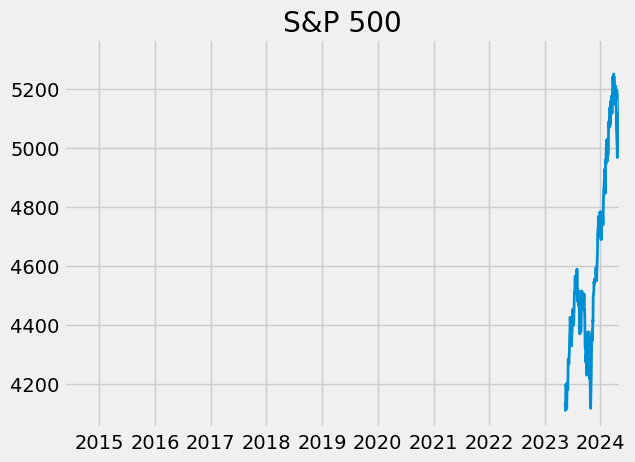

In [9]:
sp500.plot(title = 'S&P 500', lw = 2)

## 4. PULL AND JOIN MULTIPLE DATA SERIES

In [10]:
unemp_results = fred.search('unemployment')

In [11]:
unrate = fred.get_series('UNRATE')

In [12]:
unrate

1948-01-01    3.4
1948-02-01    3.8
1948-03-01    4.0
1948-04-01    3.9
1948-05-01    3.5
             ... 
2023-12-01    3.7
2024-01-01    3.7
2024-02-01    3.9
2024-03-01    3.8
2024-04-01    3.9
Length: 916, dtype: float64

<Axes: title={'center': 'UNEMPLOYMENT RATE'}>

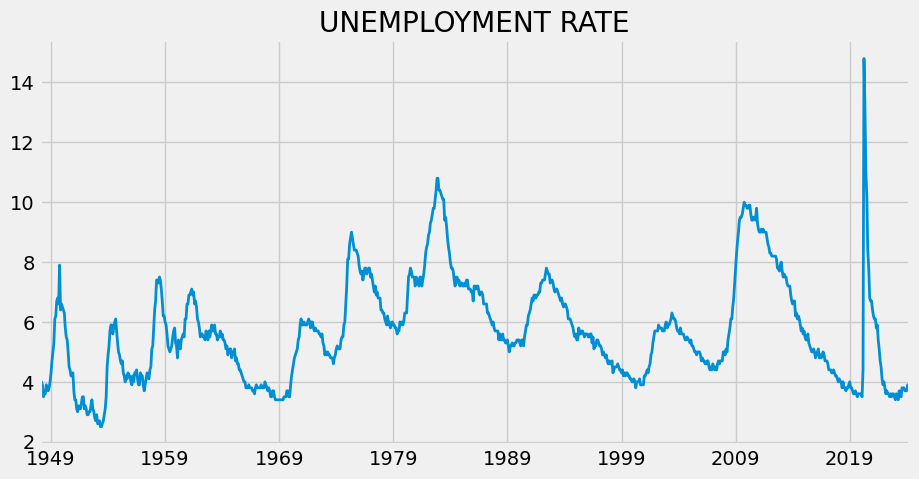

In [13]:
unrate.plot(figsize = (10,5), title = 'UNEMPLOYMENT RATE', lw = 2)

### 2019 - 2021 = COVID 19

In [14]:
unemp_results

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-05-15,2024-05-15,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:45:01-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-05-15,2024-05-15,Unemployment Rate,1948-01-01,2024-04-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-05-03 07:45:27-05:00,58,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-05-15,2024-05-15,Unemployment Level,1948-01-01,2024-04-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-05-03 07:45:20-05:00,71,The series comes from the 'Current Population ...
NROU,NROU,2024-05-15,2024-05-15,Noncyclical Rate of Unemployment,1949-01-01,2034-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2024-02-08 14:46:04-06:00,69,"Starting with the July, 2021 report: An Update..."
CCSA,CCSA,2024-05-15,2024-05-15,Continued Claims (Insured Unemployment),1967-01-07,2024-04-27,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-05-09 07:33:04-05:00,74,"Continued claims, also referred to as insured ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAUCN340030000000003A,LAUCN340030000000003A,2024-05-15,2024-05-15,"Unemployment Rate in Bergen County, NJ",1990-01-01,2023-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-01 10:48:38-05:00,0,These data come from the Current Population Su...
LMUNRRTTLUM156S,LMUNRRTTLUM156S,2024-05-15,2024-05-15,Infra-Annual Registered Unemployment and Job V...,1995-01-01,2023-12-01,Monthly,M,Growth rate previous period,Growth rate previous period,Seasonally Adjusted,SA,2024-04-10 11:07:38-05:00,5,OECD Data Filters: REF_AREA: LUX MEASURE: REG...
LNS14000315,LNS14000315,2024-05-15,2024-05-15,Unemployment Rate - Married Women,1955-01-01,2024-04-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-05-03 07:46:28-05:00,9,To obtain estimates of women worker employment...


In [15]:
unemp_df = fred.search('unemployment rate state', filter = ('frequency', 'Monthly'))
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate in ')]

In [16]:
unemp_df['title']

series id
CAUR                                      Unemployment Rate in California
TXUR                                           Unemployment Rate in Texas
NYUR                                        Unemployment Rate in New York
FLUR                                         Unemployment Rate in Florida
PAUR                                    Unemployment Rate in Pennsylvania
OHUR                                            Unemployment Rate in Ohio
MIUR                                        Unemployment Rate in Michigan
ALUR                                         Unemployment Rate in Alabama
MAUR                                   Unemployment Rate in Massachusetts
NCUR                                  Unemployment Rate in North Carolina
ILUR                                        Unemployment Rate in Illinois
NJUR                                      Unemployment Rate in New Jersey
GAUR                                         Unemployment Rate in Georgia
COUR                        

In [17]:

id_states = unemp_df['title'].str.replace('Unemployment Rate in ', '')

all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(myid)
    all_results.append(results)
unemp_results = pd.concat(all_results, axis = 1).drop(['CMWRUR','CSOUUR', 'CNERUR', 'CWSTUR', 'CNEWUR', \
                                                       'LASMT391746000000003', 'LASMT261982000000003', 'PRUR'], axis = 1)
unemp_states = unemp_results

In [18]:
unemp_states.columns = [id_states[c] for c in unemp_states.columns]

In [153]:
unemp_states

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,...,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,...,3.3,9.8,5.6,6.5,7.7,4.2,4.1,8.0,8.6,3.2
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,...,3.2,9.6,5.6,6.5,7.7,4.2,4.0,8.1,8.6,3.1
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,...,3.1,9.4,5.6,6.5,7.7,4.2,3.9,8.3,8.5,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01,5.1,3.9,4.6,3.1,3.4,3.6,4.1,2.8,3.3,3.6,...,2.5,4.2,3.3,2.6,3.4,2.6,2.9,4.1,2.3,2.1
2023-12-01,5.1,3.9,4.6,3.1,3.4,3.6,4.1,2.8,3.2,3.6,...,2.5,4.2,3.3,2.6,3.4,2.6,2.9,4.1,2.3,2.1
2024-01-01,5.2,3.9,4.5,3.1,3.4,3.7,4.0,2.9,3.0,3.5,...,2.5,4.4,3.3,2.6,3.6,2.6,2.8,4.1,2.3,2.1
2024-02-01,5.3,3.9,4.4,3.1,3.4,3.7,3.9,3.0,2.9,3.5,...,2.5,4.5,3.3,2.6,3.9,2.7,2.8,4.0,2.3,2.1


In [20]:
unemp_states = unemp_states.rename(columns= {'the District of Columbia' : 'District of Columbia'}) # DC fix
unemp_states.columns

Index(['California', 'Texas', 'New York', 'Florida', 'Pennsylvania', 'Ohio',
       'Michigan', 'Alabama', 'Massachusetts', 'North Carolina', 'Illinois',
       'New Jersey', 'Georgia', 'Colorado', 'Arizona', 'Wisconsin', 'Virginia',
       'Kentucky', 'South Carolina', 'New Mexico', 'Minnesota', 'Tennessee',
       'Washington', 'Maryland', 'Oregon', 'West Virginia', 'Nevada',
       'Arkansas', 'Oklahoma', 'Missouri', 'Alaska', 'Iowa', 'Utah', 'Indiana',
       'Louisiana', 'Hawaii', 'North Dakota', 'Montana',
       'District of Columbia', 'Mississippi', 'Maine', 'Nebraska',
       'Connecticut', 'Idaho', 'New Hampshire', 'Rhode Island', 'Kansas',
       'Wyoming', 'Delaware', 'Vermont', 'South Dakota'],
      dtype='object')

In [21]:
# PLOT UNEMPLOYMENT RATE BY STATES
px. line(unemp_states)

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


## 2024 UNEMPLOYMENT RATE BY STATES

In [41]:
unemp_2024 = unemp_states.loc[unemp_states.index >= '2024'].T

Text(0, 0.5, 'Cities')

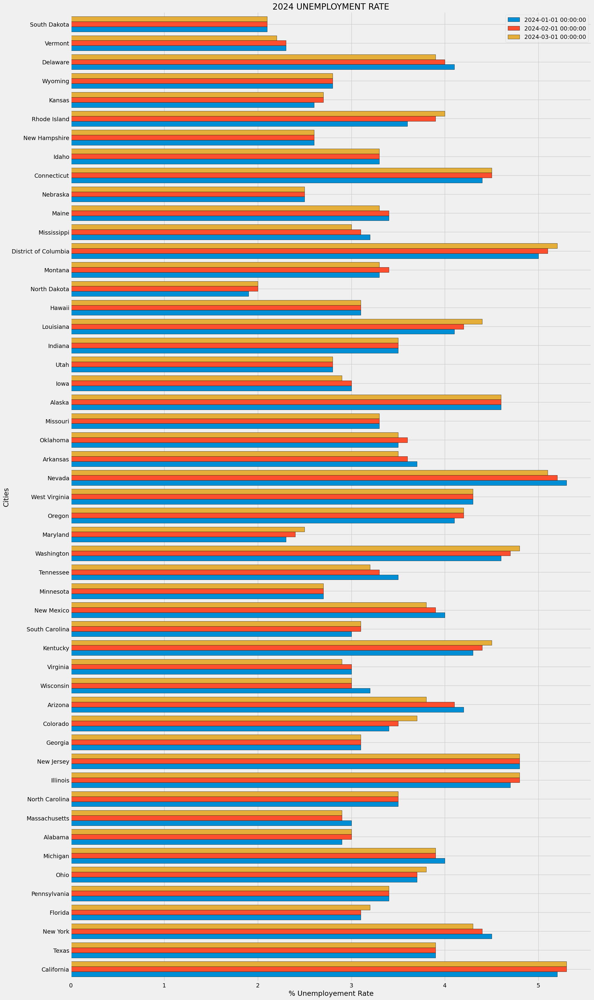

In [42]:
unemp2024 = unemp_2024.plot(kind = 'barh', figsize = (20,40), width = 0.8, edgecolor = 'black', title = '2024 UNEMPLOYMENT RATE')
unemp2024.legend()
unemp2024.set_xlabel('% Unemployement Rate')
unemp2024.set_ylabel('Cities')

## PARTICIPATION RATE

In [43]:
part_df = fred.search('participation  rate state', filter = ('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
part_df = part_df.loc[part_df['title'].str.contains('Labor Force Participation Rate for')]
part_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
LBSSA06,LBSSA06,2024-05-15,2024-05-15,Labor Force Participation Rate for California,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:04-05:00,21,A state's labor-force participation rate is th...
LBSSA01,LBSSA01,2024-05-15,2024-05-15,Labor Force Participation Rate for Alabama,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:06-05:00,13,A state's labor-force participation rate is th...
LBSSA36,LBSSA36,2024-05-15,2024-05-15,Labor Force Participation Rate for New York,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:03-05:00,23,A state's labor-force participation rate is th...
LBSSA26,LBSSA26,2024-05-15,2024-05-15,Labor Force Participation Rate for Michigan,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:02-05:00,22,A state's labor-force participation rate is th...
LBSSA28,LBSSA28,2024-05-15,2024-05-15,Labor Force Participation Rate for Mississippi,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:02-05:00,21,A state's labor-force participation rate is th...
LBSSA48,LBSSA48,2024-05-15,2024-05-15,Labor Force Participation Rate for Texas,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:03-05:00,20,A state's labor-force participation rate is th...
LBSSA12,LBSSA12,2024-05-15,2024-05-15,Labor Force Participation Rate for Florida,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:03-05:00,20,A state's labor-force participation rate is th...
LBSSA21,LBSSA21,2024-05-15,2024-05-15,Labor Force Participation Rate for Kentucky,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:02-05:00,20,A state's labor-force participation rate is th...
LBSSA39,LBSSA39,2024-05-15,2024-05-15,Labor Force Participation Rate for Ohio,1976-01-01,2024-03-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-04-19 09:01:08-05:00,14,A state's labor-force participation rate is th...


In [44]:
part_id_states = part_df['title'].str.replace('Labor Force Participation Rate for ', '').to_dict()

In [45]:
allresult = []

for myid in part_df.index:
    result = fred.get_series(myid)
    result = result.to_frame(name = myid)
    allresult.append(result)
part_states = pd.concat(allresult, axis = 1)

In [46]:
part_states.columns = [part_id_states[c] for c in part_states.columns]

## PARTICIPATION VS UNEMPLOYEMENT BY STATES

In [47]:
part_states = part_states.rename(columns= {'District Of Columbia' : 'District of Columbia'}) # DC fix
part_states.columns

Index(['California', 'Alabama', 'New York', 'Michigan', 'Mississippi', 'Texas',
       'Florida', 'Kentucky', 'Ohio', 'Wisconsin', 'Pennsylvania',
       'Massachusetts', 'Minnesota', 'Maryland', 'West Virginia', 'Tennessee',
       'Maine', 'Illinois', 'North Carolina', 'Georgia', 'Louisiana',
       'South Carolina', 'Colorado', 'Utah', 'Virginia', 'Indiana', 'Missouri',
       'New Jersey', 'Iowa', 'Alaska', 'Washington', 'Arizona', 'New Mexico',
       'Idaho', 'Arkansas', 'Oklahoma', 'Nebraska', 'Hawaii', 'Nevada',
       'Montana', 'Oregon', 'New Hampshire', 'Vermont', 'Connecticut',
       'North Dakota', 'South Dakota', 'Kansas', 'Rhode Island',
       'District of Columbia', 'Delaware', 'Wyoming'],
      dtype='object')

IndexError: index 50 is out of bounds for axis 0 with size 50

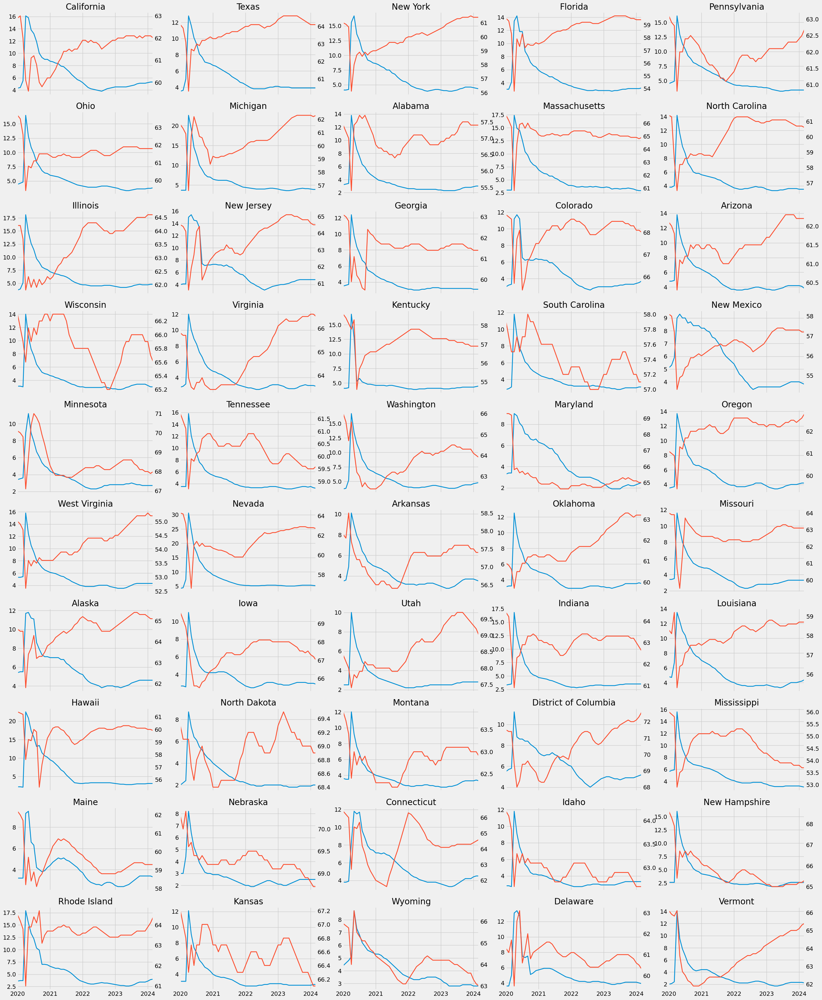

In [48]:
fig, axs = plt.subplots(10, 5, figsize = (30, 40), sharex = True)
axs = axs.flatten()

i = 0
for state in unemp_states.columns:
   # if state == "District of Columbia":
   #     continue
    ax2 = axs[i].twinx()
    unemp_states.query('index >= 2020')[state].plot(ax = axs[i], label = 'Unemployment'\
                                                           , lw = 2)
    part_states.query('index >= 2020')[state].plot(ax = ax2, label = 'Participation', color = color_pal[1],\
                                                          lw = 2)
    ax2.grid(False)
    axs[i].set_title(state)
    i += 1
plt.tight_layout()
plt.show()

# UNEMPLOYMENT BY GENDER

In [49]:
unemp_results = fred.search('unemployment rate')

In [50]:
unemp_results.title['LNS14000001']

'Unemployment Rate - Men'

In [51]:
fred.search('unemployment rate men')
unemp_men = fred.get_series('LNS14000001')

In [52]:
unemp_men.to_frame()

,0
1948-01-01,3.4
1948-02-01,3.6
1948-03-01,3.8
1948-04-01,3.8
1948-05-01,3.5
...,...
2023-12-01,3.9
2024-01-01,3.9
2024-02-01,3.8
2024-03-01,3.7


## UNEMPLOYMENT IN MEN

<Axes: title={'center': 'UNEMPLOYTMENT RATE IN MEN'}>

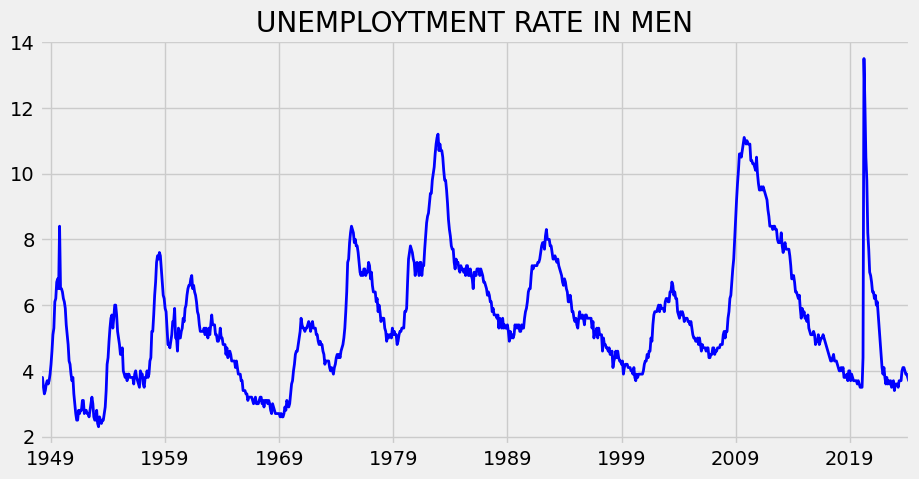

In [53]:
unemp_men.plot(kind = 'line', figsize = (10,5), title = 'UNEMPLOYTMENT RATE IN MEN', lw = 2, color = 'blue') 

In [54]:
unemp_m = fred.search('unemployment rate men', filter = ('frequency', 'Monthly'))
unemp_m = unemp_m.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_m = unemp_m.loc[unemp_m['title'].str.contains('Unemployment Rate - ')]

In [55]:
unemp_m.title

series id
LNS14000031    Unemployment Rate - 20 Yrs. & over, Black or A...
LNS14000001                              Unemployment Rate - Men
LNS14000028        Unemployment Rate - 20 Yrs. & over, White Men
LNS14000025              Unemployment Rate - 20 Yrs. & over, Men
LNS14000061                  Unemployment Rate - 25-54 Yrs., Men
LNS14000150                      Unemployment Rate - Married Men
LNS14000037                  Unemployment Rate - 20-24 Yrs., Men
LNS14000173                  Unemployment Rate - 35-44 Yrs., Men
LNS14000164                  Unemployment Rate - 25-34 Yrs., Men
LNS14000013                  Unemployment Rate - 16-19 Yrs., Men
LNS14024231              Unemployment Rate - 55 Yrs. & over, Men
LNS14024885                  Unemployment Rate - 16-24 Yrs., Men
LNS14000049              Unemployment Rate - 25 Yrs. & over, Men
LNS14000154                  Unemployment Rate - 18-19 Yrs., Men
LNS14000182                  Unemployment Rate - 45-54 Yrs., Men
LNS14000152    

In [56]:
id_men = unemp_m['title'].str.replace('Unemployment Rate - ', '').to_dict()

In [57]:
mresult = []

for myid in unemp_m.index:
    result = fred.get_series(myid)
    result = result.to_frame(name = myid)
    mresult.append(result)
unemp_m = pd.concat(mresult, axis = 1)

In [58]:
unemp_m.columns = [id_men[c] for c in unemp_m.columns]

In [59]:
new_names = {'Men' : 'Men (Overall)', 
             '16-19 Yrs., Men' : '16-19', 
             '20-24 Yrs., Men' : '20-24',
             '25-34 Yrs., Men' : '25-34', 
             '35-44 Yrs., Men' : '35-44',
             '45-54 Yrs., Men' : '45-54',
             '55 Yrs. & over, Men' : '55 Over'}

unemp_m = unemp_m.rename(columns = new_names) # arrange data

In [73]:
unemp_m = unemp_m.drop(['20 Yrs. & over, Black or African American Men',
              '20 Yrs. & over, White Men',
              '20 Yrs. & over, Men',
              '25-54 Yrs., Men',  
              '16-24 Yrs., Men',
              '18-19 Yrs., Men', 
              '25 Yrs. & over, Men', 
              '16-17 Yrs., Men'], axis = 1) #clean data

### UNEMPLOYMENT IN MEN - AGE GROUPS

In [74]:
px. line(unemp_m) # men plot

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## UNEMPLOYMENT IN WOMEN

In [61]:
fred.search('unemployment rate women')
unemp_women = fred.get_series('LNS14000002')

<Axes: title={'center': 'UNEMPLOYTMENT RATE IN WOMEN'}>

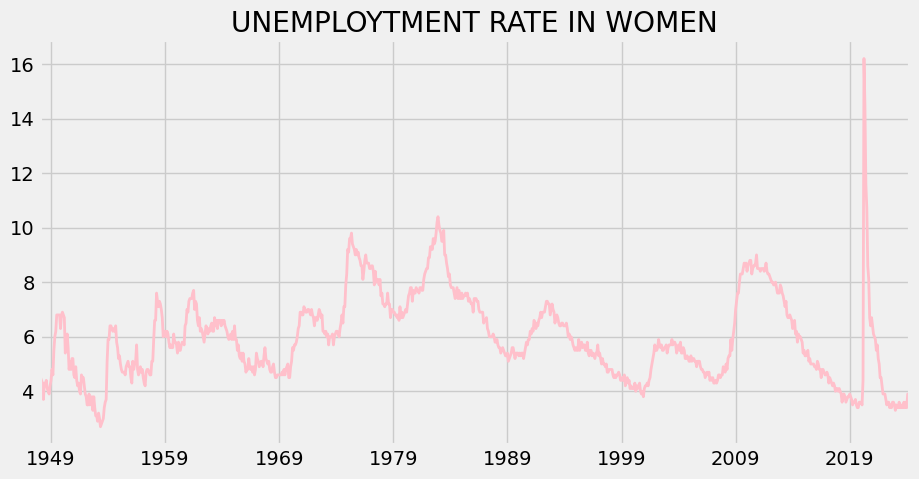

In [62]:
unemp_women.plot(figsize = (10, 5), title = 'UNEMPLOYTMENT RATE IN WOMEN', lw = 2, color = 'pink')

In [63]:
unemp_w = fred.search('unemployment rate women', filter = ('frequency', 'Monthly'))
unemp_w = unemp_w.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_w = unemp_w.loc[unemp_w['title'].str.contains('Unemployment Rate - ')]

In [64]:
unemp_w.title

series id
LNS14000002                            Unemployment Rate - Women
LNS14000032    Unemployment Rate - 20 Yrs. & over, Black or A...
LNS14000315                    Unemployment Rate - Married Women
LNS14000029      Unemployment Rate - 20 Yrs. & over, White Women
LNS14000026            Unemployment Rate - 20 Yrs. & over, Women
LNS14000062                Unemployment Rate - 25-54 Yrs., Women
LNS14000014                Unemployment Rate - 16-19 Yrs., Women
LNS14000327                Unemployment Rate - 25-34 Yrs., Women
LNS14024886                Unemployment Rate - 16-24 Yrs., Women
LNS14000038                Unemployment Rate - 20-24 Yrs., Women
LNS14024232            Unemployment Rate - 55 Yrs. & over, Women
LNS14000319                Unemployment Rate - 18-19 Yrs., Women
LNS14000050            Unemployment Rate - 25 Yrs. & over, Women
LNS14000334                Unemployment Rate - 35-44 Yrs., Women
LNS14000341                Unemployment Rate - 45-54 Yrs., Women
LNS14000317    

In [65]:
id_women = unemp_w['title'].str.replace('Unemployment Rate - ', '').to_dict()

In [66]:
wresult = []

for myid in unemp_w.index:
    result = fred.get_series(myid)
    result = result.to_frame(name = myid)
    wresult.append(result)
unemp_w = pd.concat(wresult, axis = 1)

In [67]:
unemp_w.columns = [id_women[c] for c in unemp_w.columns]

In [68]:
unemp_w = unemp_w.drop(['20 Yrs. & over, Black or African American Women',
              '20 Yrs. & over, White Women',
              '20 Yrs. & over, Women',
              '25-54 Yrs., Women',  
              '16-24 Yrs., Women',
              '18-19 Yrs., Women', 
              '25 Yrs. & over, Women', 
              '16-17 Yrs., Women'], axis = 1) #clean data

In [69]:
new_names = {'Women' : 'Women (Overall)', 
             '16-19 Yrs., Women' : '16-19', 
             '20-24 Yrs., Women' : '20-24',
             '25-34 Yrs., Women' : '25-34',
             '35-44 Yrs., Women' : '35-44',
             '45-54 Yrs., Women' : '45-54',
             '55 Yrs. & over, Women' : '55 Over'}

unemp_w = unemp_w.rename(columns = new_names) # arrange data

In [70]:
new_order = ['Women (Overall)', '16-19', '20-24', '25-34', '35-44', '45-54', '55 Over', 'Married Women']
unemp_w = unemp_w[new_order]

### UNEMPLOYMENT IN WOMEN - AGE GROUPS

In [71]:
px.line(unemp_w)

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## UNEMPLOYMENT RATE MEN vs WOMEN

In [199]:
# Get Mens and Womens unemployment rate data

unemp_men
unemp_women

1948-01-01    3.3
1948-02-01    4.5
1948-03-01    4.4
1948-04-01    4.3
1948-05-01    3.7
             ... 
2023-12-01    3.6
2024-01-01    3.4
2024-02-01    3.9
2024-03-01    3.9
2024-04-01    3.8
Length: 916, dtype: float64

In [336]:
# combine data

unemp_WoMen = pd.DataFrame({
    'Men' : unemp_men,
    'Women' : unemp_women
}).dropna()

unemp_WoMen = unemp_WoMen.loc[unemp_WoMen.index >= '2020']

Text(0, 0.5, 'Date')

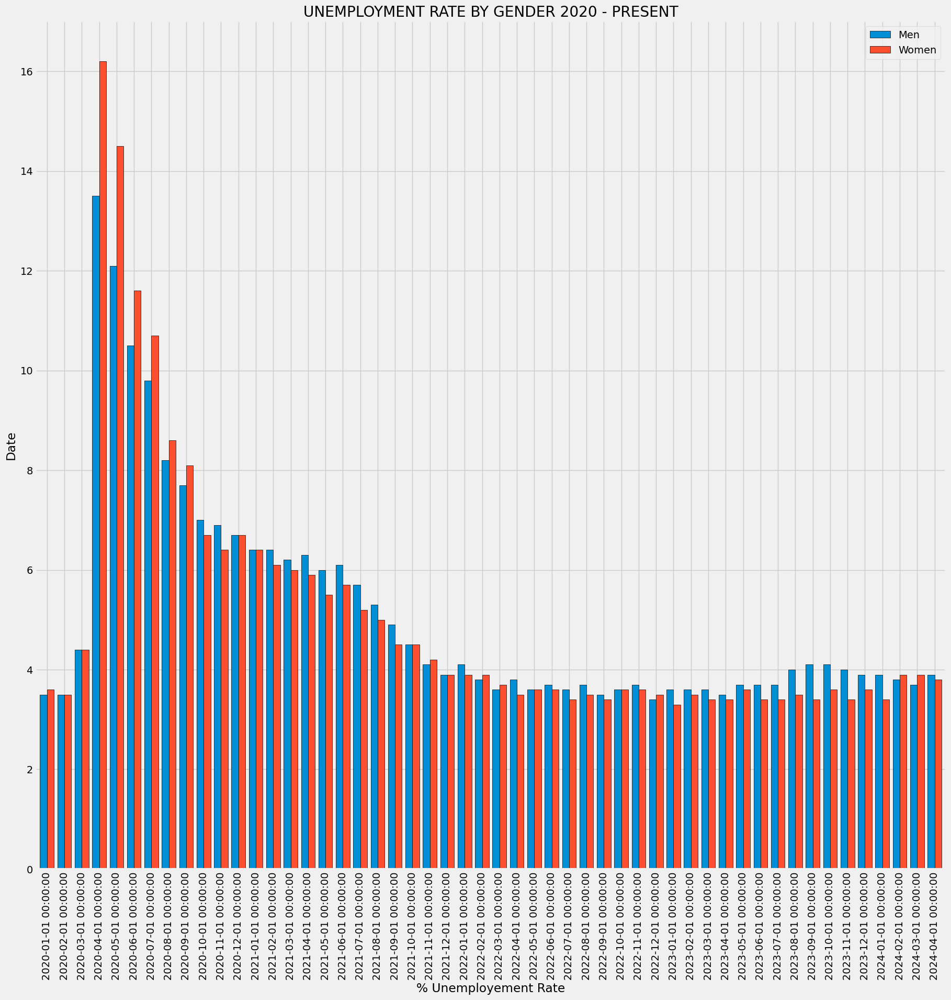

In [337]:
# Visualization

unempmw = unemp_WoMen.plot(kind = 'bar', figsize = (20,20), width = 0.8, edgecolor = 'black', title = 'UNEMPLOYMENT RATE BY GENDER 2020 - PRESENT')
unempmw.legend()
unempmw.set_xlabel('% Unemployement Rate')
unempmw.set_ylabel('Date')

# CORRELATION ANALYSIS

### UNEMPLOYMENT RATE vs GDP

In [108]:
# Fetching Unemployement(fetced) and GDP data

GDP = fred.get_series('GDP')


1946-01-01          NaN
1946-04-01          NaN
1946-07-01          NaN
1946-10-01          NaN
1947-01-01      243.164
1947-04-01      245.968
1947-07-01      249.585
1947-10-01      259.745
1948-01-01      265.742
1948-04-01      272.567
1948-07-01      279.196
1948-10-01      280.366
1949-01-01      275.034
1949-04-01      271.351
1949-07-01      272.889
1949-10-01      270.627
1950-01-01      280.828
1950-04-01      290.383
1950-07-01      308.153
1950-10-01      319.945
1951-01-01      336.000
1951-04-01      344.090
1951-07-01      351.385
1951-10-01      356.178
1952-01-01      359.820
1952-04-01      361.030
1952-07-01      367.701
1952-10-01      380.812
1953-01-01      387.980
1953-04-01      391.749
1953-07-01      391.171
1953-10-01      385.970
1954-01-01      385.345
1954-04-01      386.121
1954-07-01      390.996
1954-10-01      399.734
1955-01-01      413.073
1955-04-01      421.532
1955-07-01      430.221
1955-10-01      437.092
1956-01-01      439.746
1956-04-01      

In [112]:
# Combine Data
unemp_corr = pd.DataFrame({
    'Unemployment Rate' : unrate,
    'GDP' : GDP
}).dropna()

unemp_corr

,Unemployment Rate,GDP
1948-01-01,3.4,265.742
1948-04-01,3.9,272.567
1948-07-01,3.6,279.196
1948-10-01,3.7,280.366
1949-01-01,4.3,275.034
1949-04-01,5.3,271.351
1949-07-01,6.7,272.889
1949-10-01,7.9,270.627
1950-01-01,6.5,280.828
1950-04-01,5.8,290.383


In [165]:
# Calculate correlation matrix

unemp_gdp_correlation = unemp_corr.corr()

print(unemp_gdp_correlation)

                   Unemployment Rate       GDP
Unemployment Rate           1.000000  0.023262
GDP                         0.023262  1.000000


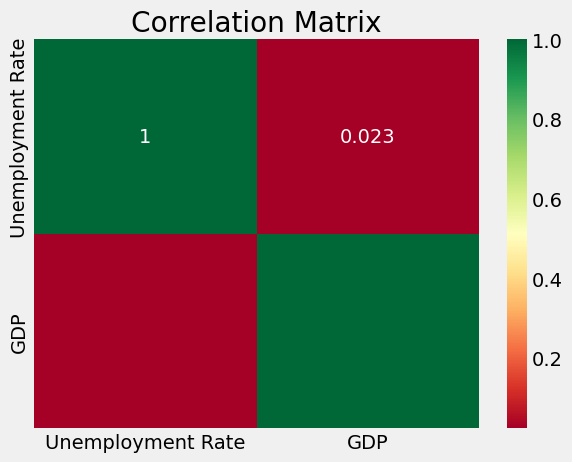

In [174]:
# Visualize

import seaborn as sns
      
sns.heatmap(unemp_gdp_correlation, annot=True, cmap='RdYlGn')
plt.title('Correlation Matrix')
plt.show()

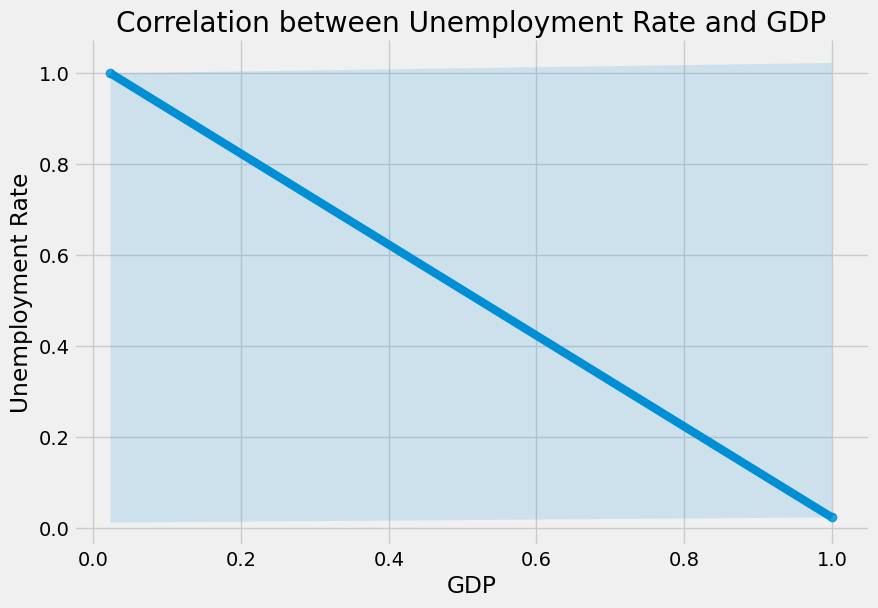

In [179]:
sns.lmplot(x='GDP', y='Unemployment Rate', data=unemp_gdp_correlation, aspect=1.5, height=6)
plt.title('Correlation between Unemployment Rate and GDP')
plt.xlabel('GDP')
plt.ylabel('Unemployment Rate')
plt.show()

In [143]:
# The correlation value between Unemployment Rate and GDP is close to zero.
# This means that there is no significant relationship between the two in your data.
# In simple terms, changes in GDP do not predict changes in the Unemployment Rate, based on your dataset.

### UNEMPLOYMENT RATE vs INFLATION

In [156]:
# Get Consumer Price Index data to calculate Inflation rate

cpi = fred.get_series('CPIAUCSL')

In [158]:
# Calcuate Inflation rate as percent change in CPI

inflation_rate = cpi.pct_change() * 100
inflation_rate

1947-01-01         NaN
1947-02-01    0.651769
1947-03-01    1.757632
1947-04-01    0.000000
1947-05-01   -0.227273
                ...   
2023-12-01    0.233099
2024-01-01    0.305433
2024-02-01    0.442062
2024-03-01    0.378069
2024-04-01    0.312910
Length: 928, dtype: float64

In [189]:
# Combine data

unemp_inflation = pd.DataFrame({
    'Unemployment Rate' : unrate,
    'Inflation Rate' : inflation_rate,
    
}).dropna()

#unemp_inflation = unemp_inflation.loc[unemp_inflation.index >= '2020']
unemp_inflation

,Unemployment Rate,Inflation Rate
1948-01-01,3.4,1.153353
1948-02-01,3.8,-0.042230
1948-03-01,4.0,-0.718209
1948-04-01,3.9,1.361702
1948-05-01,3.5,0.797649
...,...,...
2023-12-01,3.7,0.233099
2024-01-01,3.7,0.305433
2024-02-01,3.9,0.442062
2024-03-01,3.8,0.378069


In [190]:
# Calculate Correlation Matrix

unemp_inflation_correlation = unemp_inflation.corr()
unemp_inflation_correlation

,Unemployment Rate,Inflation Rate
Unemployment Rate,1.000000,0.005422
Inflation Rate,0.005422,1.000000


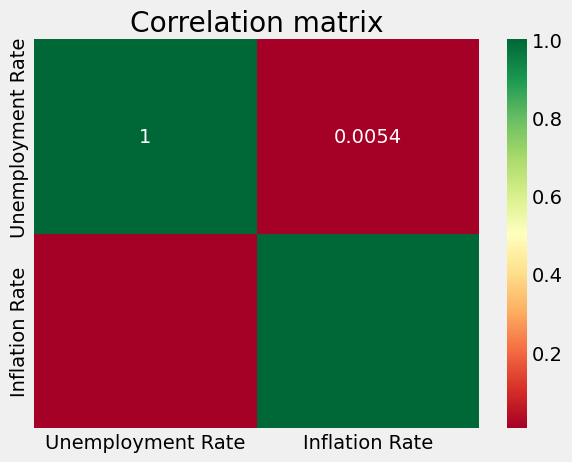

In [191]:
# Visualize

sns.heatmap(unemp_inflation_correlation, cmap = "RdYlGn", annot = True)
plt.title('Correlation matrix')
plt.show()

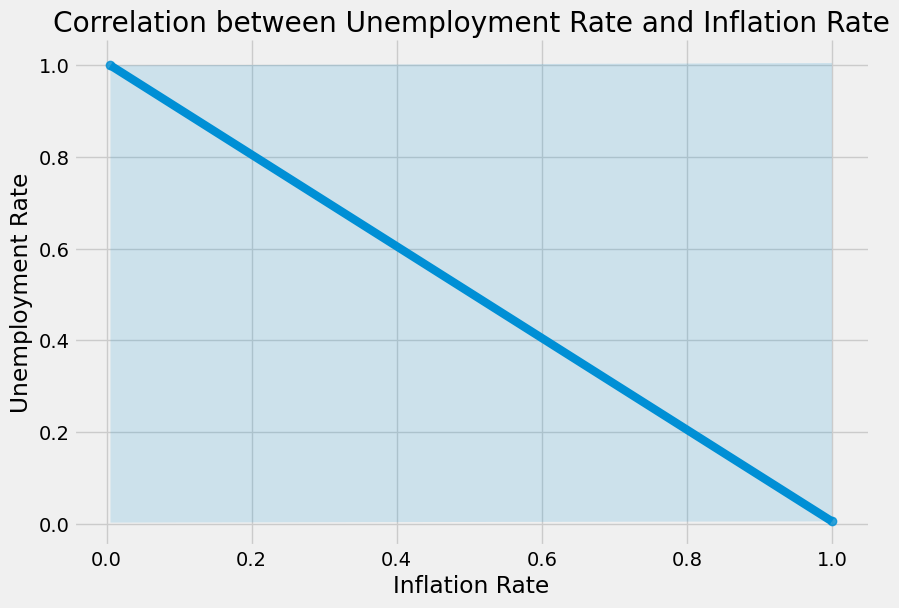

In [192]:
# Scatter Plot

sns.lmplot(x='Inflation Rate', y='Unemployment Rate', data=unemp_inflation_correlation, aspect=1.5, height=6)
plt.title('Correlation between Unemployment Rate and Inflation Rate')
plt.xlabel('Inflation Rate')
plt.ylabel('Unemployment Rate')
plt.show()

In [182]:
# The coefficient is 0.005422, which is very close to 0,
# This indicates that there is almost no relationship between the `Unemployment Rate` and the `Inflation Rate`.
# In other words, changes in the inflation rate do not have a consistent, linear impact on the unemployment rate, and vice versa.